### Imports

In [1]:
import numpy as np
import pandas as pd

import pyeeg
from scipy import signal
from entropy import *

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt

### Data Dictionary 

In [2]:
ELECTRODES = ['AF3','AF4','F7','F8','F3','F4','FC5','FC6','T7','T8','P7','P8','O1','O2']
BRAINWAVES = ['Theta','Alpha','BetaL','BetaH','Gamma']
RANGES  = {'Delta':[1,4],'Theta':[4,8],"Alpha":[8,12],'BetaL':[12,16], 'BetaH':[16,25],'Gamma':[25,45]}
MOTION = ['Q0','Q1','Q2','Q3','AccX','AccY','AccZ','MagX','MagY','MagZ']
MENTAL = ["Engagement","Excitement","Stress","Relaxation","Interest","Focus"]

### Load EEG data from CSV 

In [3]:
# filename
FILENAME = "Test_06.11.20_14.28.18.md.pm.bp.csv"

In [4]:
# load data from csv
RECORDS = pd.read_csv("data/" +  FILENAME,low_memory=False,header=1).sort_values(by=['Timestamp'])

# reset time to zero
RECORDS['Timestamp'] = RECORDS['Timestamp'] - RECORDS['Timestamp'].iloc[0]

# process data
for e in ELECTRODES:
    
    # filter eeg signal - DC offset
    channel = "EEG."+e
    b,a = signal.butter(1, 0.16,'highpass',fs=128,output='ba')
    RECORDS[channel+".FILTERED"] = signal.filtfilt(b, a, RECORDS[RECORDS[channel].notnull()][channel])
    
    # calculate relative band powers
    for w in BRAINWAVES:
        c = "POW."+e+"."+w
        RECORDS[c+".REL"] = RECORDS[c]/RECORDS.loc[:,RECORDS.columns.str.startswith("POW."+e+".")].sum(axis=1)
    
    # extract EEG frequency bands
    for w,freqs in RANGES.items():
        x = RECORDS[RECORDS[channel + ".FILTERED"].notnull()][channel + ".FILTERED"]
        freqs = RANGES[w]
        b,a = signal.butter(6, [freqs[0]/64,freqs[1]/64], btype='band')
        RECORDS[channel+"."+w] = signal.lfilter(b,a,x)

### Filter Records 

In [5]:
def filter_records(start_t=0.0,stop_t=None):
    data = RECORDS[RECORDS['Timestamp'] > start_t]
    if stop_t != None: data = data[data['Timestamp']<stop_t]
    return data

In [6]:
#DATA = filter_records(202,232)
DATA = filter_records(195,255)

### Plot Channel Data 

In [7]:
def plot_channel(channel):
    data = DATA[DATA[channel].notnull()][['Timestamp',channel]]
    plt.plot(data['Timestamp'],data[channel],label=channel)
    plt.title(channel,fontsize=13,fontweight='bold')
    plt.show()
    
def plot_filtered_channel(channel):
    data = DATA[DATA[channel].notnull()][['Timestamp',channel]]
    b,a = signal.butter(1, 0.16,'highpass',fs=128,output='ba')
    filtered = signal.filtfilt(b, a, data[channel])
    
    plt.plot(data['Timestamp'],filtered)
    plt.title(channel + " - filtered",fontsize=13,fontweight='bold')
    plt.show()

### EEG & Band Power

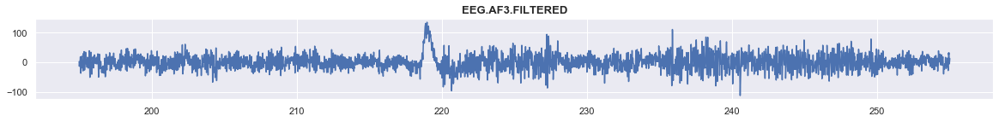

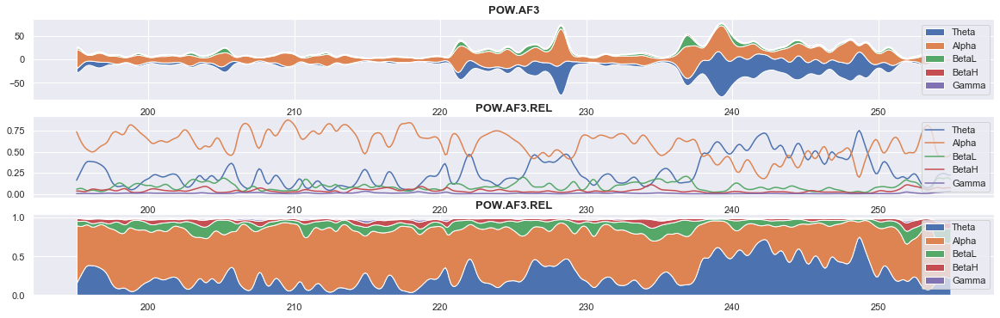

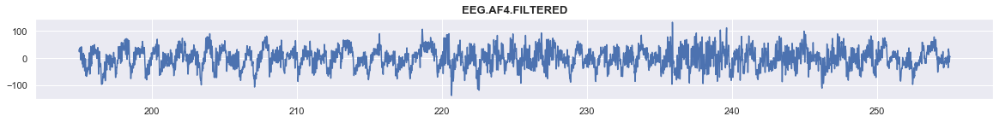

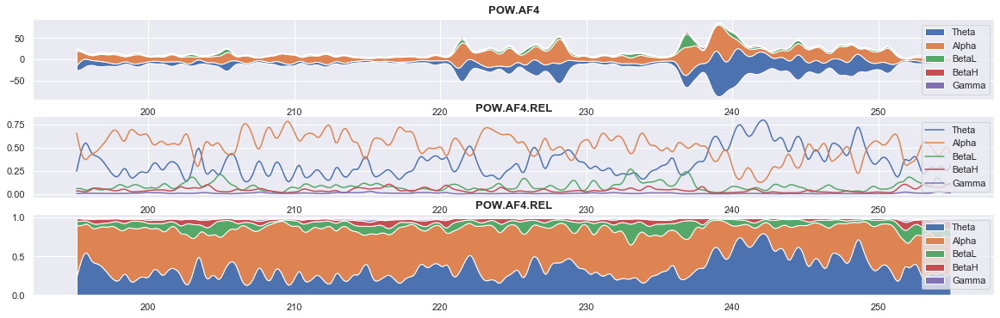

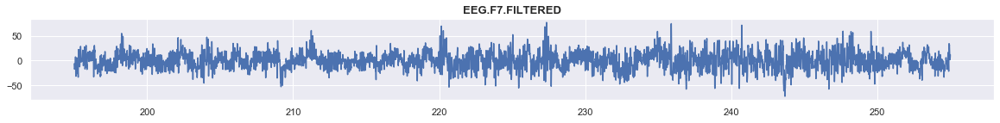

...

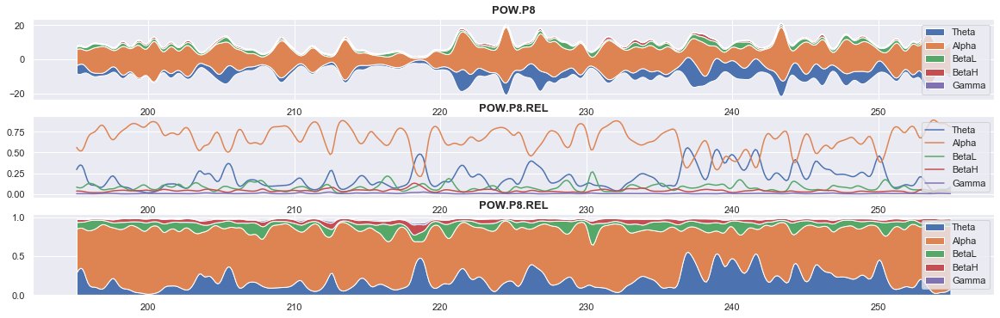

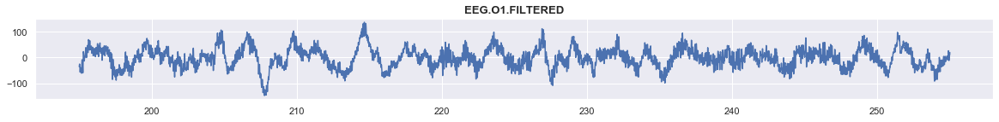

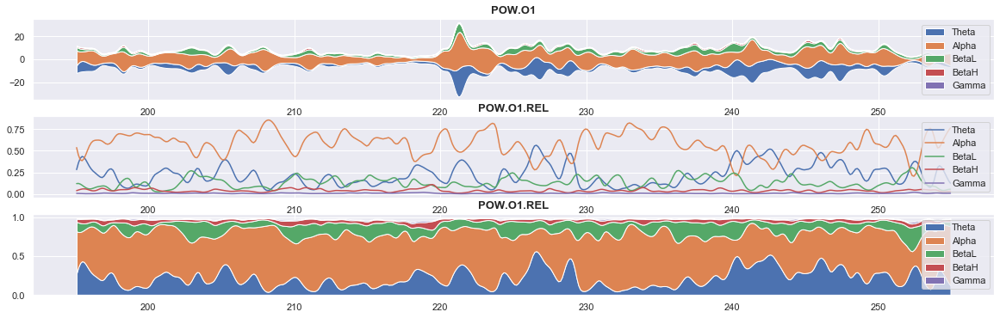

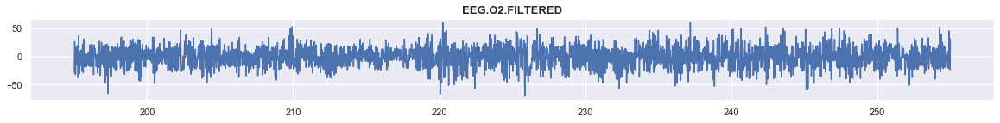

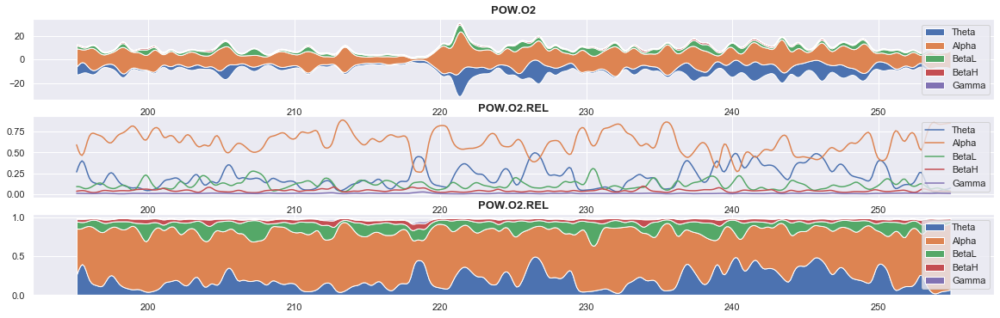

In [8]:
sns.set(rc={'figure.figsize':(20, 8)})

for e in ELECTRODES:
    
    waves = [] ; relative = []; labels = []
    for w in BRAINWAVES:
        channel = "POW." + e + "." + w
        
        # absolute band power
        waves.append(DATA[DATA[channel].notnull()][[channel]][channel])
        labels.append(w)
        
        # relative band power
        rel = channel + ".REL"
        relative.append(DATA[DATA[rel].notnull()][[rel]][rel])
    
    # get timestamps
    ts = DATA[DATA['POW.'+ELECTRODES[0]+'.'+BRAINWAVES[0]].notnull()][['Timestamp']]['Timestamp']
    
    # start plotting
    fig, ax = plt.subplots()
    
    # plot eeg channel
    ax = plt.subplot(4, 1, 1)
    plot_channel('EEG.'+e+".FILTERED")
        
    # plot absolute band power
    ax = plt.subplot(4, 1, 2)
    ax.stackplot(ts, waves, labels=labels,baseline='sym')
    plt.legend(loc='center right')
    plt.title('POW.'+e,fontsize=13,fontweight='bold')

    
    # plot relative band power
    ax = plt.subplot(4, 1, 3)
    for i, w in enumerate(relative):
        plt.plot(ts,w,label=labels[i])
        plt.legend(loc='center right')
        plt.title('POW.'+e+'.REL',fontsize=13,fontweight='bold')
    
    # plot relative band power - stacked
    ax = plt.subplot(4, 1, 4)
    ax.stackplot(ts, relative, labels=labels)
    plt.legend(loc='center right')
    plt.title('POW.'+e+'.REL',fontsize=13,fontweight='bold')

### EEG Frequency Bands

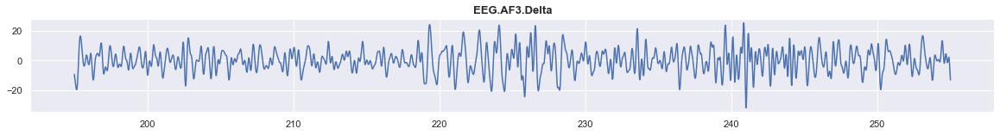

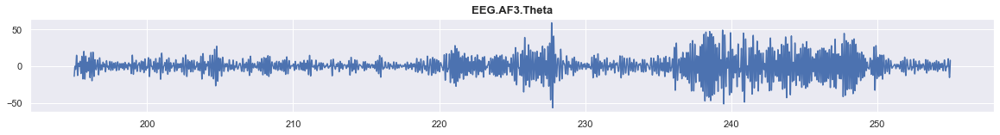

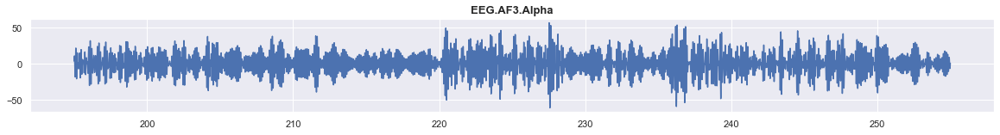

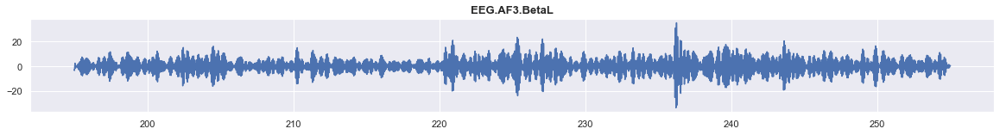

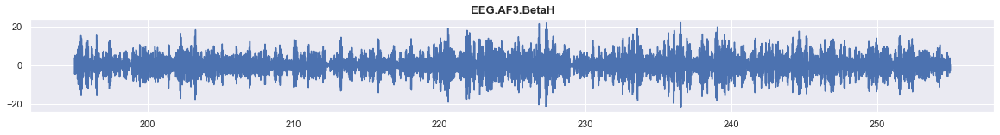

...

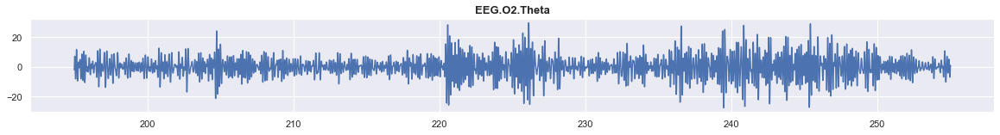

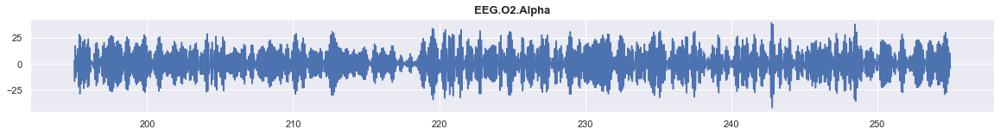

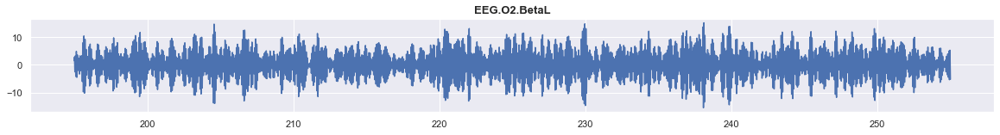

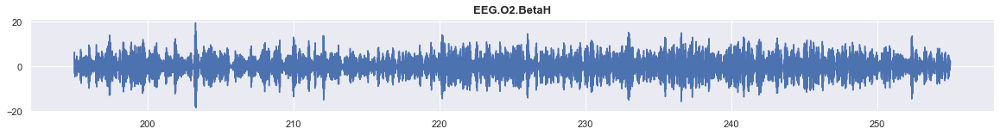

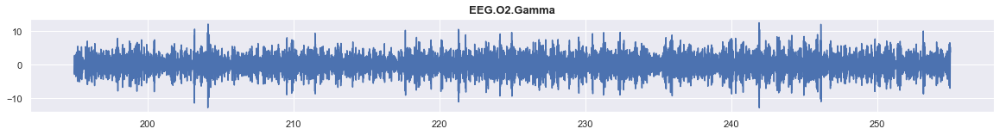

In [9]:
sns.set(rc={'figure.figsize':(20, 2)})
for e in ELECTRODES:
    for w in RANGES.keys():
        channel = "EEG." + e
        data = DATA[DATA[channel+"."+ w].notnull()][['Timestamp',channel+"."+ w]]
        plt.plot(data['Timestamp'],data[channel+"."+ w],label=w)
        plt.title(channel+"."+ w,fontsize=13,fontweight='bold')
        plt.show()

### Power Spectogram

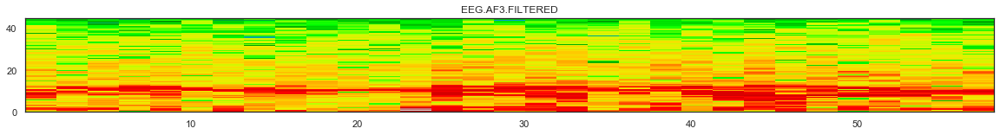

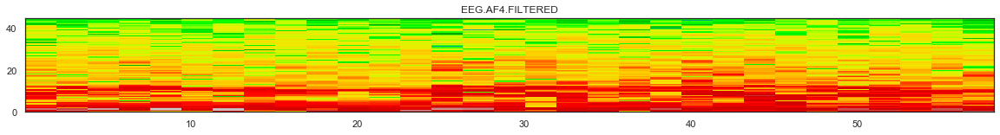

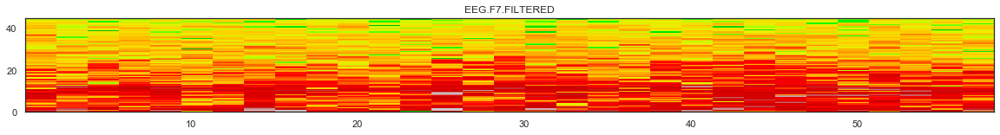

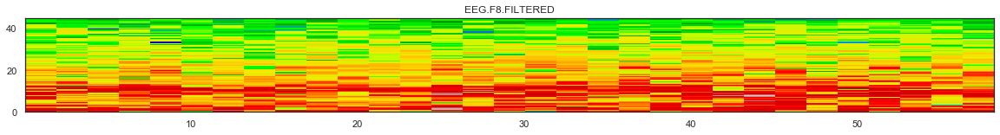

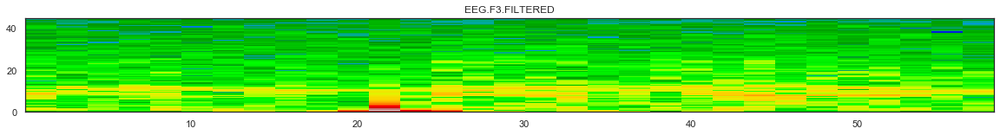

...

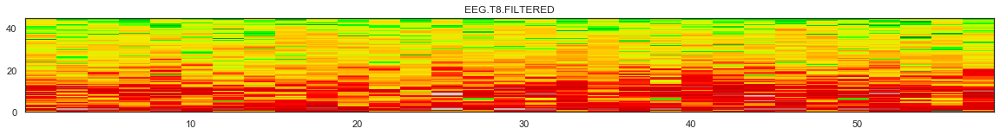

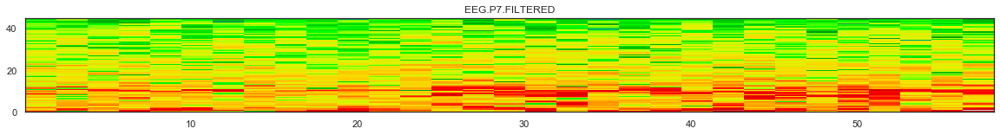

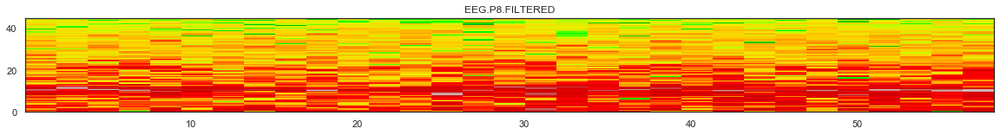

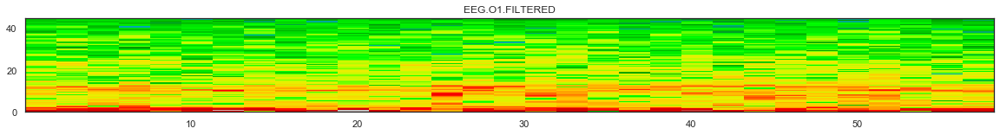

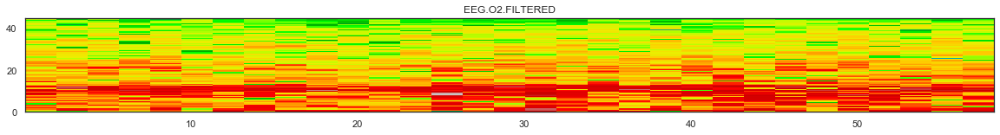

In [10]:
sns.set(rc={'figure.figsize':(20, 2)})
for e in ELECTRODES:
    channel = 'EEG.' + e + ".FILTERED"
    data =  DATA[DATA[channel].notnull()][channel]
    cmap = plt.cm.get_cmap("nipy_spectral")
    sns.set_style("white")
    plt.specgram(data,Fs=128,cmap=cmap,noverlap=16)
    plt.axis(ymin=0, ymax=45)
    plt.title(channel)
    plt.show()

### Power Spectral Density 

In [11]:
SF = 128         # sampling frequency
WIN = 4 * SF     # window length (4 sec)

def spectral_density(freq):
    fig, axes = plt.subplots(7, 2,figsize=(20,16))
    axes = axes.flatten()

    for i, e in enumerate(ELECTRODES):
        # filter records
        data = DATA['EEG.'+e+".FILTERED"].dropna()

        # welch signal
        freqs, psd = signal.welch(data, SF, nperseg=WIN)

        # Find intersecting values in frequency vector
        low = RANGES[freq][0] ; high = RANGES[freq][1] ; 
        idx_delta = np.logical_and(freqs >= low, freqs <= high)

        # Plot the power spectral density and fill the delta area
        axes[i].plot(freqs, psd, lw=2, color='k')
        axes[i].fill_between(freqs, psd, where=idx_delta)
        axes[i].set(xlabel='Frequency (Hz)')
        axes[i].set(xlim=[low-.1, high+.1])
        axes[i].set(xticks=np.arange(low, high, step=1))

        ymax = max(psd[np.all([freqs >= low, freqs <= high], axis=0)])
        axes[i].set(ylim=[0, 1.1*ymax])
        axes[i].set_title(e + ' - ' + freq,fontsize=13,fontweight="bold")
        
        sns.despine()
    plt.tight_layout()

def spectral_density_summary():
    for freq in list(RANGES.keys()):
        spectral_density(freq)

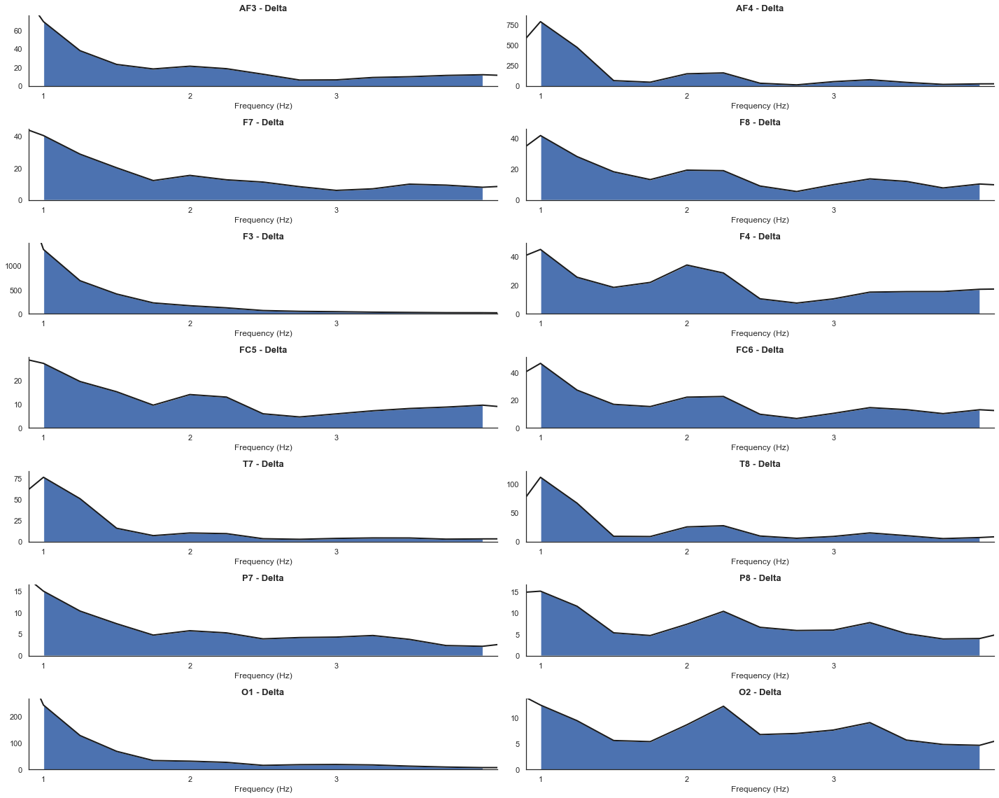

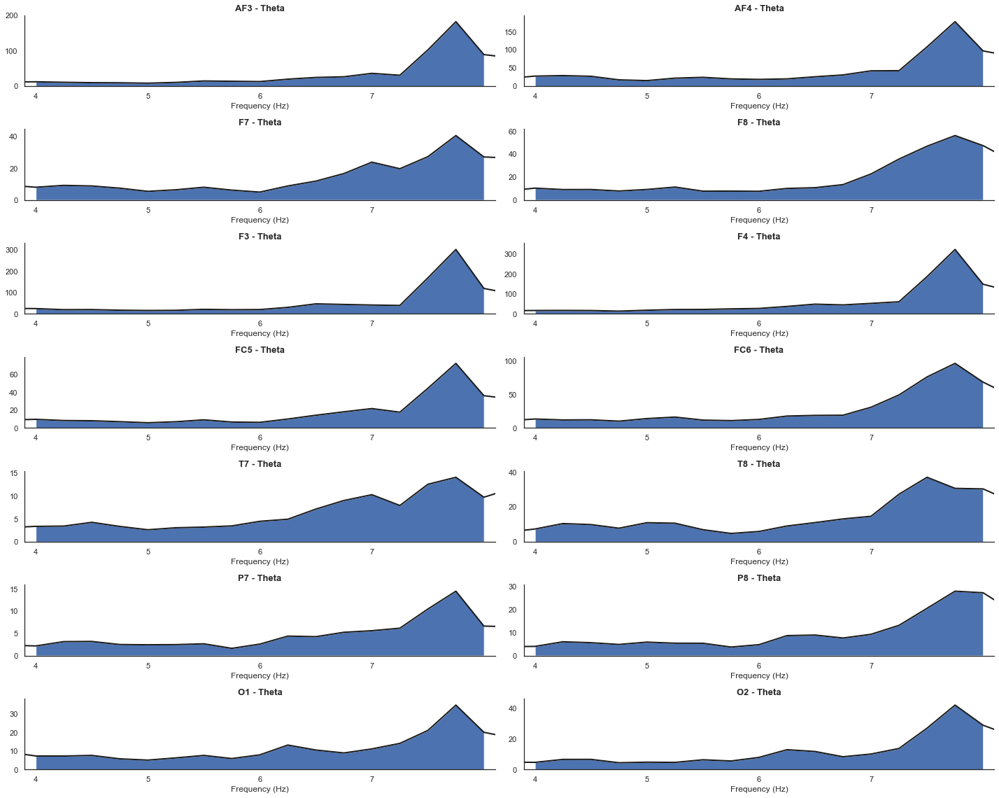

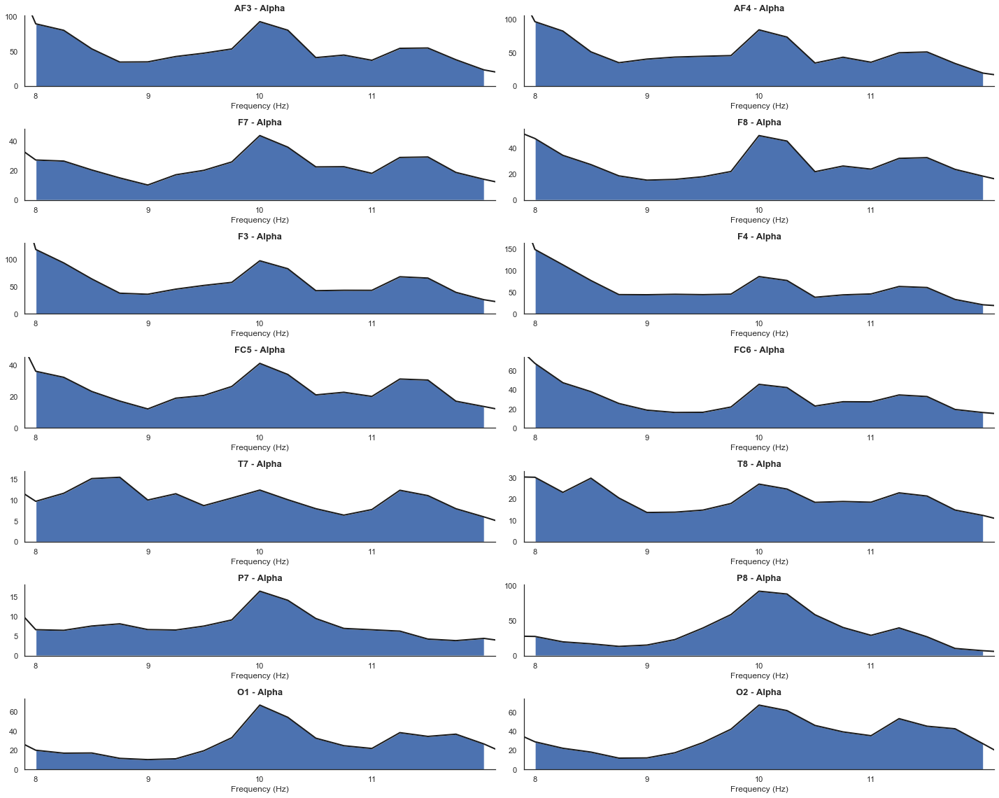

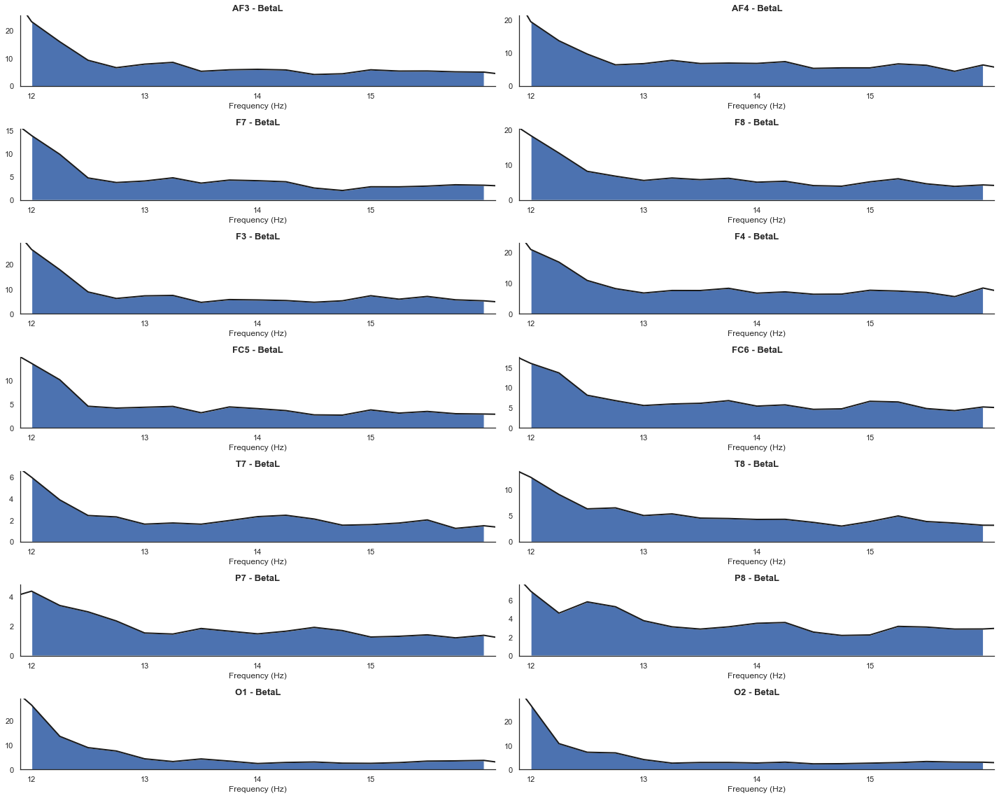

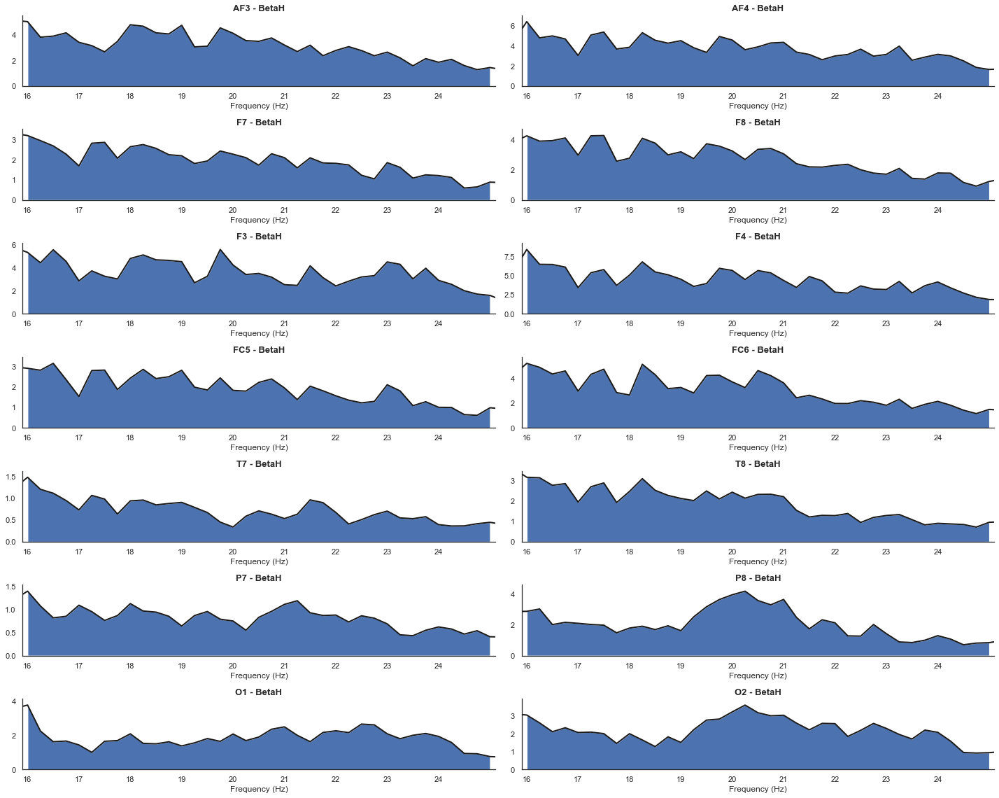

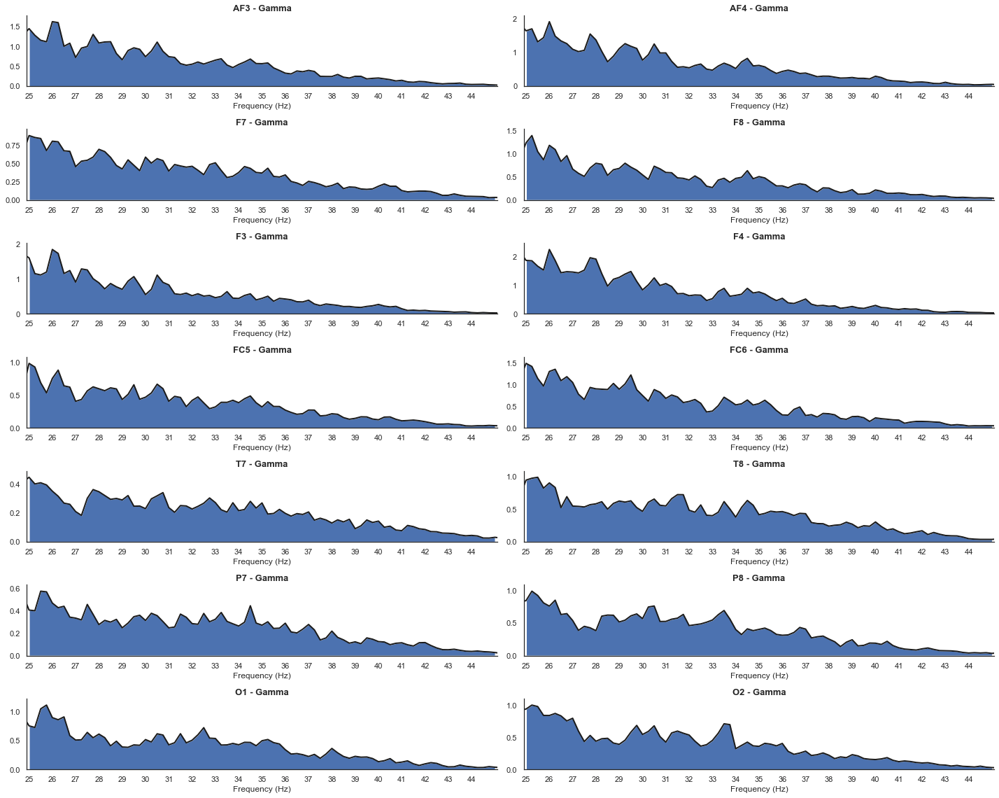

In [12]:
spectral_density_summary()

### Signal Coherence


In [13]:
def plot_coherence(electrode):
    x = DATA[DATA["EEG."+electrode+".FILTERED"].notnull()]["EEG."+electrode+".FILTERED"]
    for e in ELECTRODES:
        if electrode != e:
            y = DATA[DATA["EEG."+e+".FILTERED"].notnull()]["EEG."+e+".FILTERED"]
            f, Cxy = signal.coherence(x, y, 128)
            plt.semilogy(f, Cxy,label=electrode + '/' + e)
            plt.xlabel('Frequency [Hz]')
            plt.ylabel('Coherence')
            plt.grid(True, which="both")
            plt.ylim(1e-4,1)
            plt.xlim(0,45)
            plt.xticks(np.arange(0, 45, 5.0))
            plt.title(electrode,fontweight="bold",fontsize=13)


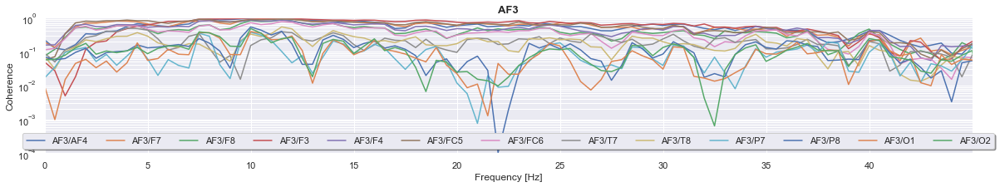

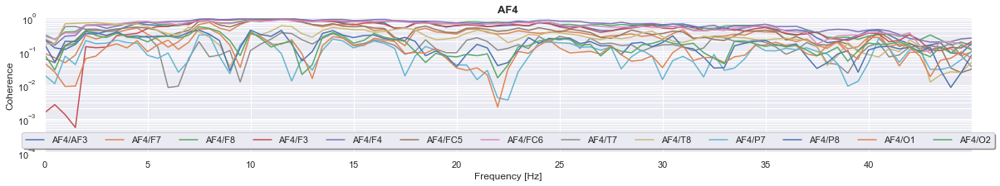

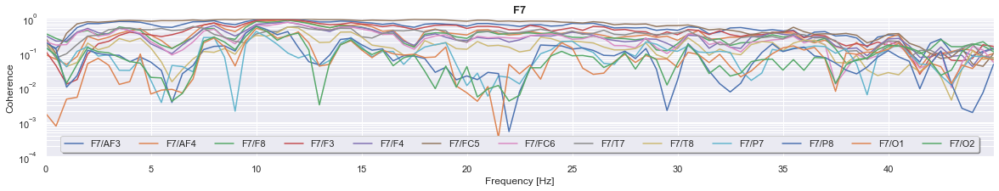

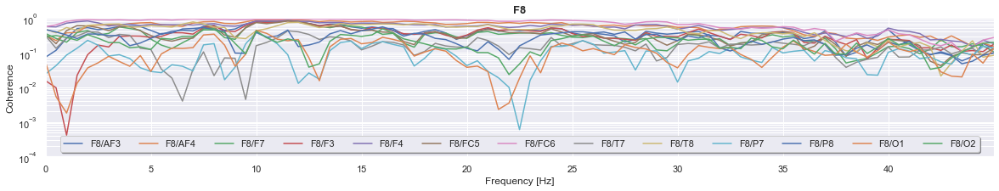

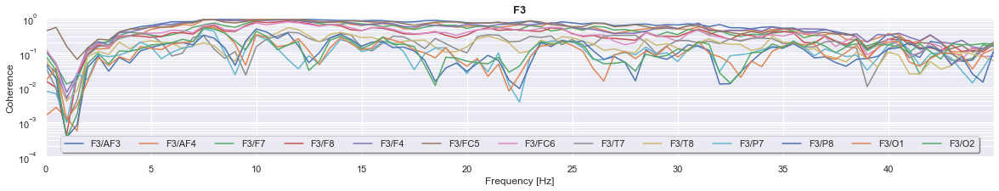

...

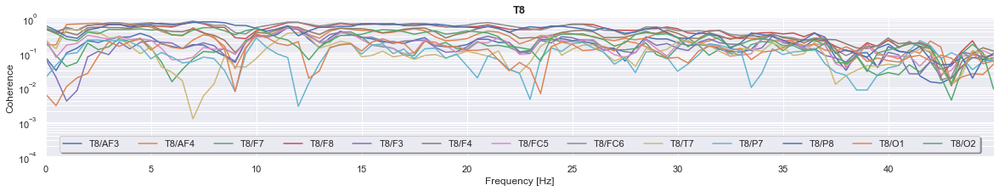

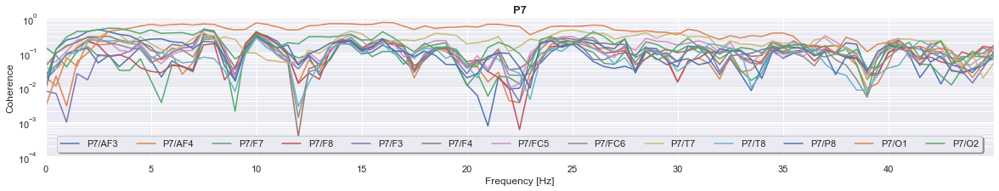

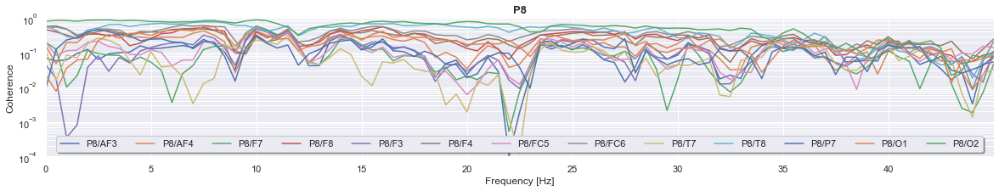

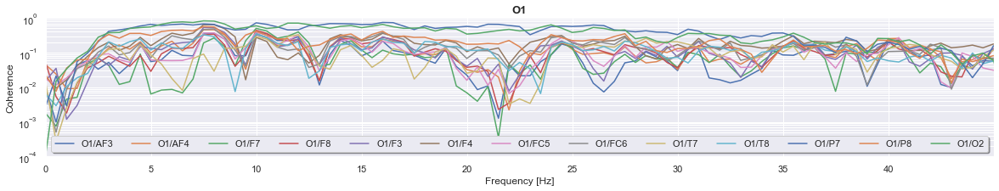

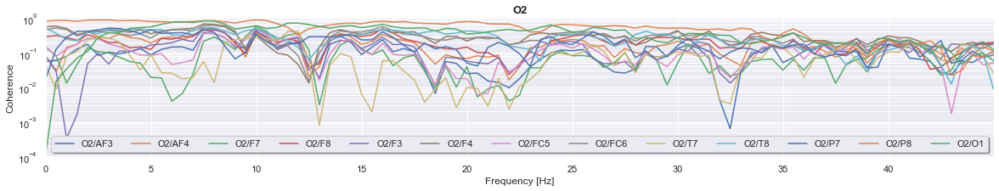

In [14]:
sns.set(rc={'figure.figsize':(20,3)})

for e in ELECTRODES:
    plot_coherence(e)
    plt.legend(loc='lower center',shadow=True,ncol=13)
    plt.show()

### Higuchi Fractal Dimension, Hurst Exponent, & Permutation Entropy

In [15]:
def slidingWindow(sequence,winSize,step=1):
    # compute number of chunks to emit
    numOfChunks = int(((len(sequence)-winSize)/step)+1)
 
    # do the work
    for i in range(0,numOfChunks*step,step):
        yield sequence[i:i+winSize]
        
def moving_average(a, n=6) :
    ret = np.cumsum(a, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n

/home/michael/anaconda3/lib/python3.7/site-packages/pyeeg-0.4.4-py3.7.egg/pyeeg/hurst.py:54: RuntimeWarning: invalid value encountered in true_divide
/home/michael/anaconda3/lib/python3.7/site-packages/pyeeg-0.4.4-py3.7.egg/pyeeg/hurst.py:58: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


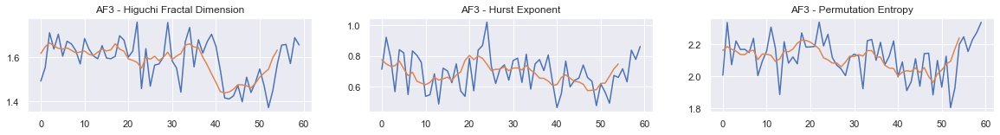

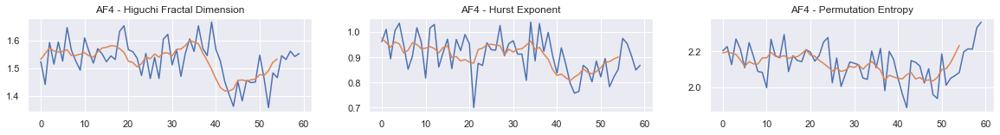

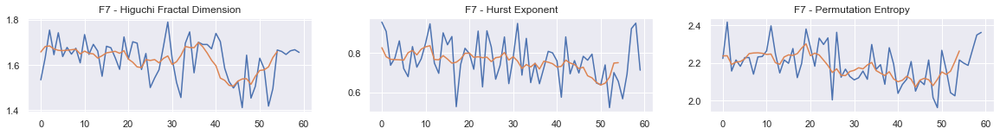

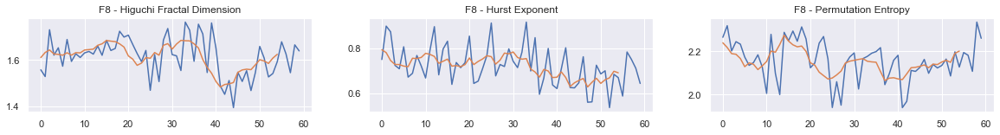

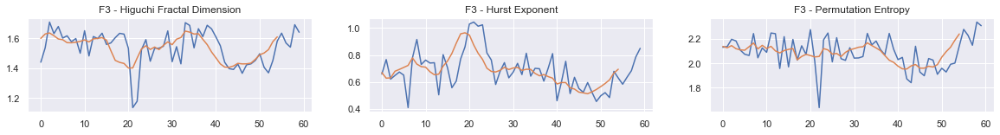

...

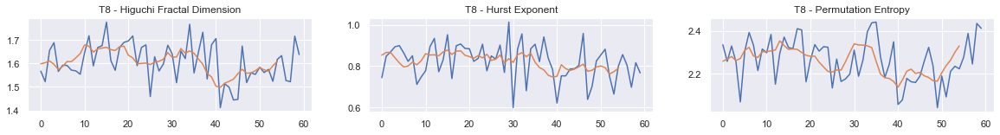

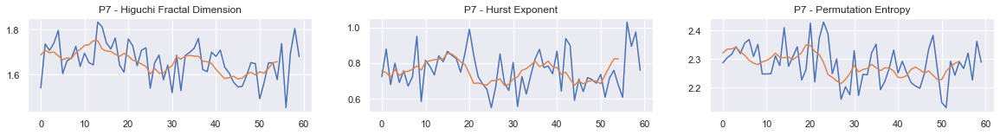

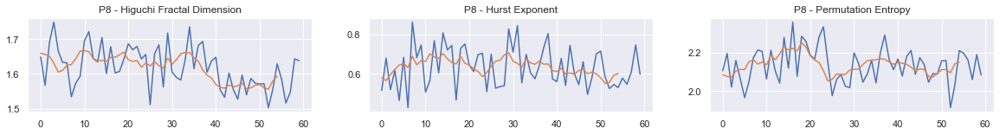

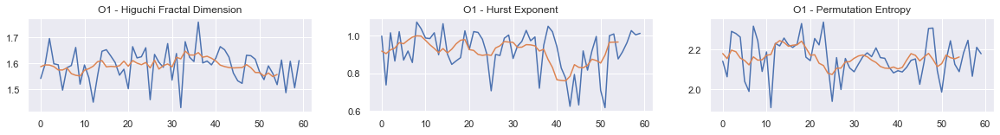

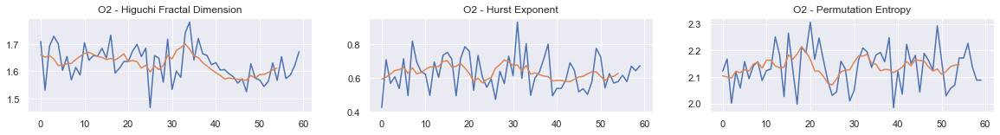

In [16]:
for e in ELECTRODES:
    eeg = DATA[DATA["EEG."+e+".FILTERED"].notnull()]["EEG."+e+".FILTERED"]
    sw = slidingWindow(eeg,128,128) ; hfd = []; hst =[] ; pe = []
    for chunk in sw:
        hfd.append(higuchi_fd(chunk))
        hst.append(pyeeg.hurst(chunk))
        pe.append(perm_entropy(chunk, order=3, delay=1))
    
    sns.set(rc={'figure.figsize':(20, 2)})
    fig, ax = plt.subplots()
    
    ax = plt.subplot(1, 3, 1)
    plt.title(e + ' - Higuchi Fractal Dimension')
    plt.plot(hfd)
    plt.plot(moving_average(hfd))
    
    ax = plt.subplot(1, 3, 2)
    plt.title(e + ' - Hurst Exponent')
    plt.plot(hst)
    plt.plot(moving_average(hst))
                  
    ax = plt.subplot(1, 3, 3)
    plt.title(e + ' - Permutation Entropy')
    plt.plot(pe)
    plt.plot(moving_average(pe))
    
    plt.show()

### Spectral, SVD, & Sample Entropy 

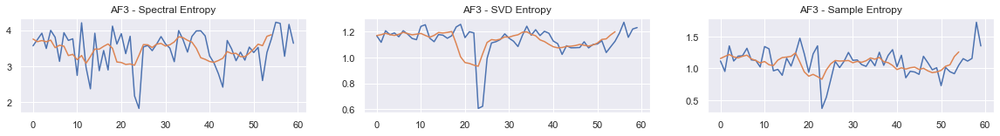

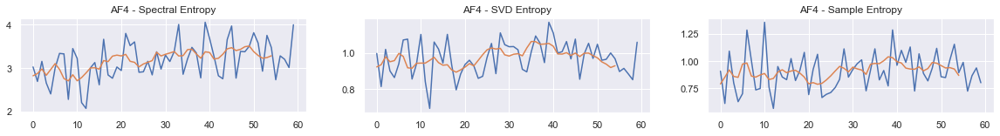

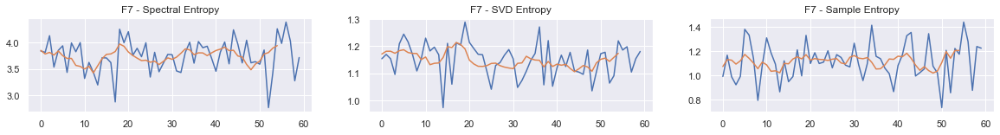

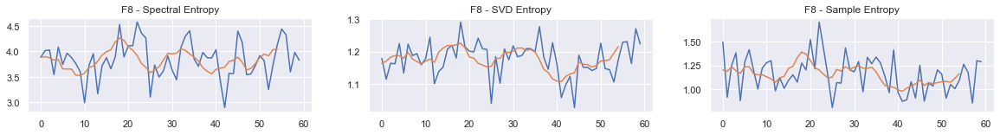

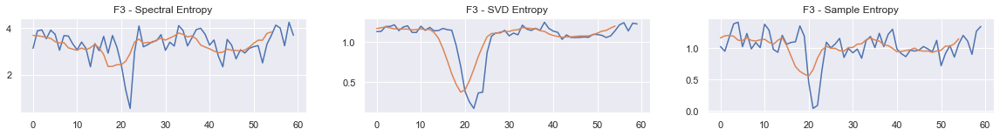

...

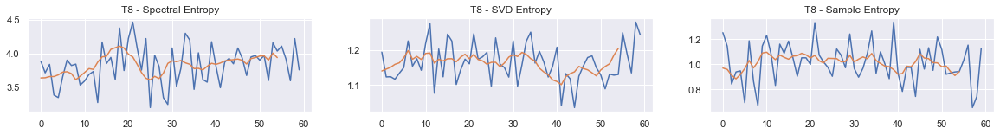

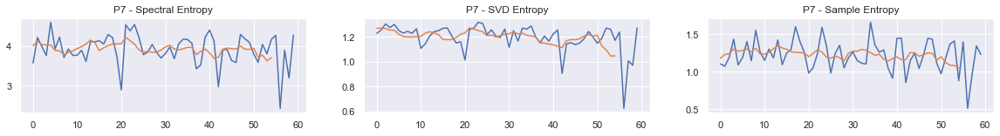

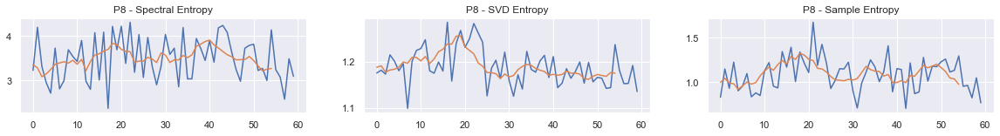

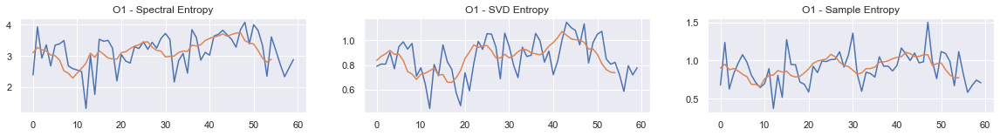

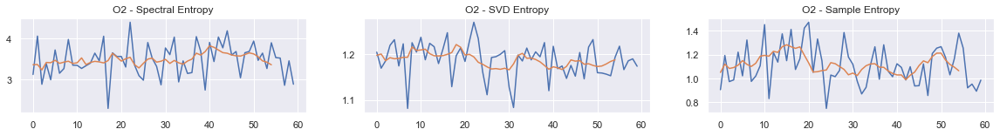

In [17]:
for e in ELECTRODES:
    eeg = DATA[DATA["EEG."+e+".FILTERED"].notnull()]["EEG."+e+".FILTERED"]
    sw = slidingWindow(eeg,128,128) ; spe = [] ; svd = [] ; sae = []
    for chunk in sw:
        spe.append(spectral_entropy(chunk,128,nperseg=128,method="welch"))
        svd.append(svd_entropy(chunk))
        sae.append(sample_entropy(chunk))
    
    sns.set(rc={'figure.figsize':(20, 2)})
    fig, ax = plt.subplots()
    
    ax = plt.subplot(1, 3, 1)
    plt.title(e + ' - Spectral Entropy')
    plt.plot(spe)
    plt.plot(moving_average(spe))
    
    ax = plt.subplot(1, 3, 2)
    plt.title(e + ' - SVD Entropy')
    plt.plot(svd)
    plt.plot(moving_average(svd))
                  
    ax = plt.subplot(1, 3, 3)
    plt.title(e + ' - Sample Entropy')
    plt.plot(sae)
    plt.plot(moving_average(sae))
    
    plt.show()

### Katz Fractal Dimension, Petrosian Fractal Dimension, & Detrended Fluctuation

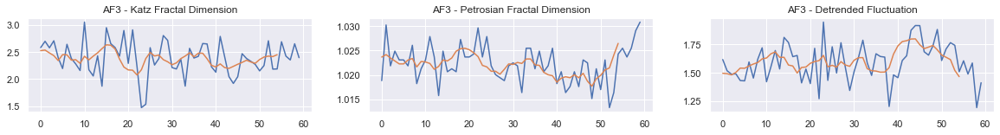

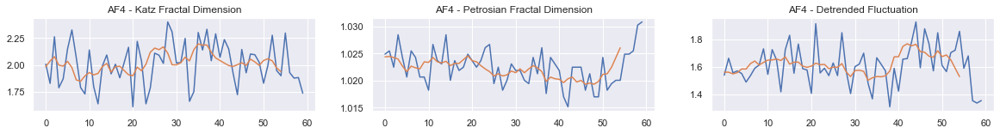

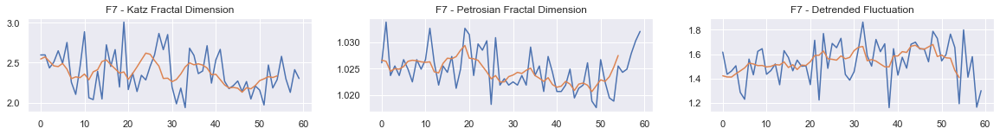

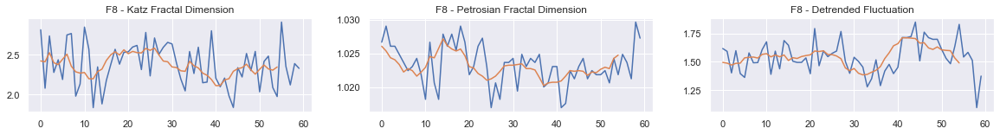

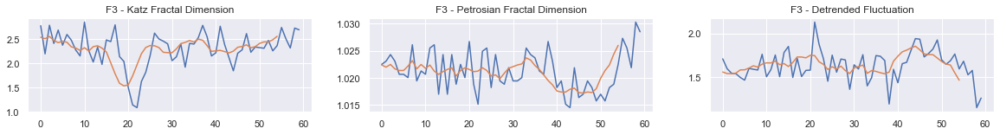

...

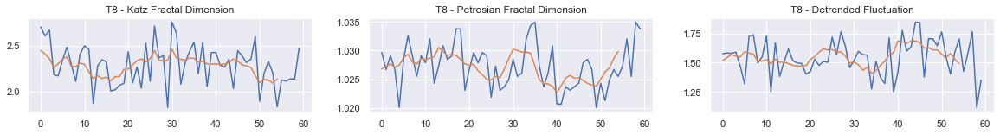

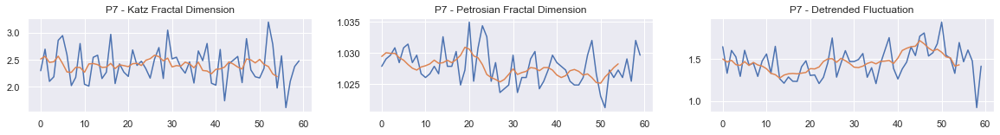

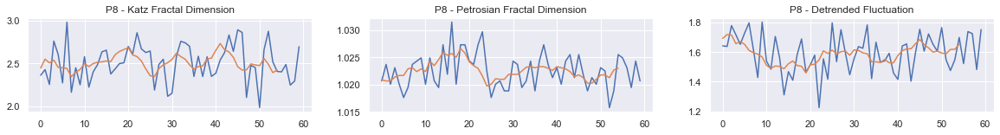

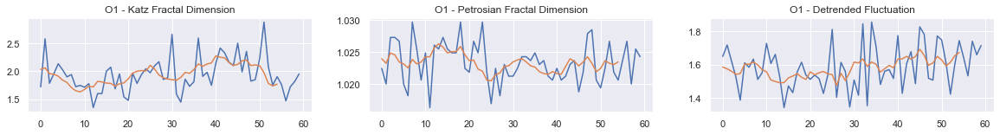

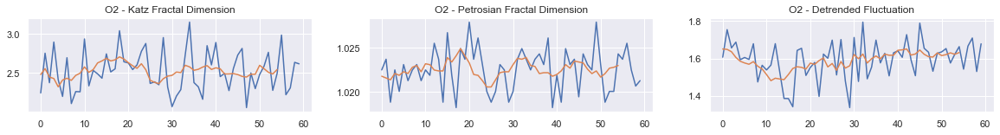

In [18]:
for e in ELECTRODES:
    eeg = DATA[DATA["EEG."+e+".FILTERED"].notnull()]["EEG."+e+".FILTERED"]
    sw = slidingWindow(eeg,128,128) ; kfd = []  ; pfd = [] ; dtf = []
    for chunk in sw:
        kfd.append(katz_fd(chunk))
        pfd.append(petrosian_fd(chunk))
        dtf.append(detrended_fluctuation(chunk))
    
    sns.set(rc={'figure.figsize':(20, 2)})
    fig, ax = plt.subplots()
    
    ax = plt.subplot(1, 3, 1)
    plt.title(e + ' - Katz Fractal Dimension')
    plt.plot(kfd)
    plt.plot(moving_average(kfd))
    
    ax = plt.subplot(1, 3, 2)
    plt.title(e + ' - Petrosian Fractal Dimension')
    plt.plot(pfd)
    plt.plot(moving_average(pfd))
                  
    ax = plt.subplot(1, 3, 3)
    plt.title(e + ' - Detrended Fluctuation')
    plt.plot(dtf)
    plt.plot(moving_average(dtf))
    
    plt.show()

### Motion 

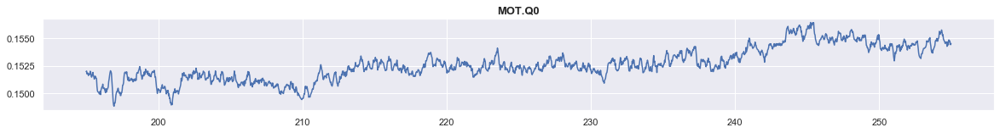

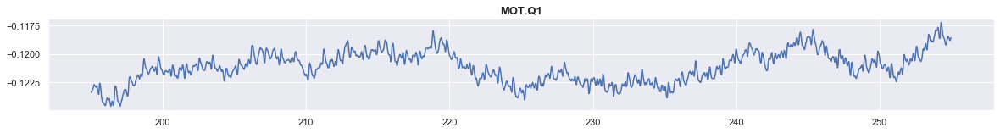

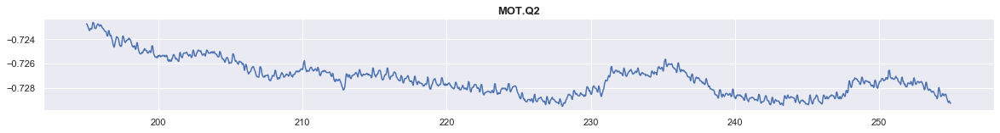

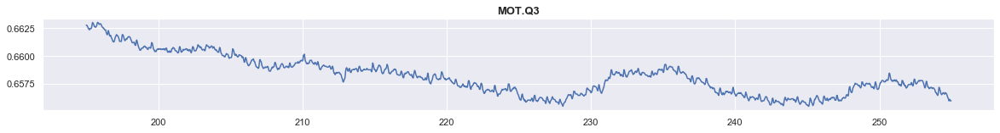

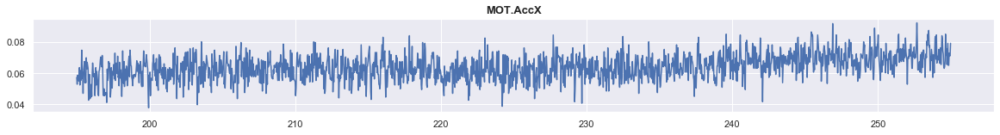

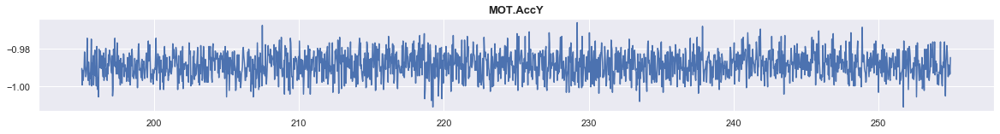

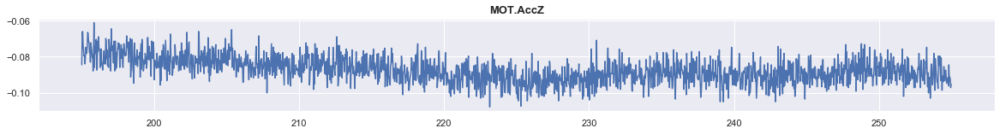

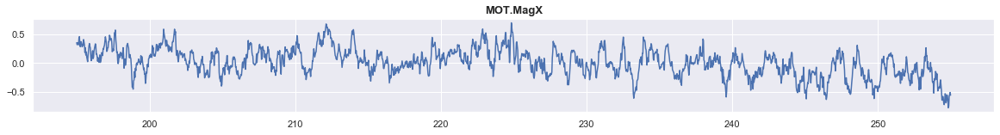

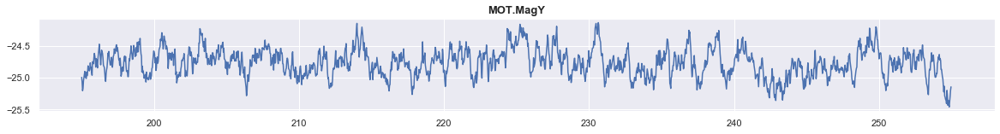

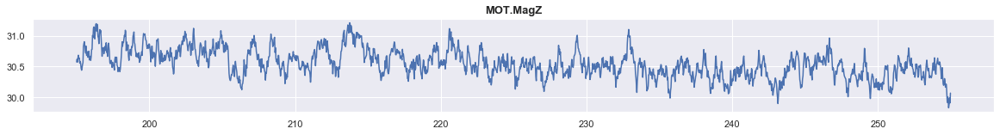

In [19]:
sns.set(rc={'figure.figsize':(20, 2)})
for m in MOTION:
    plot_channel("MOT." + m)

### Performance Metrics

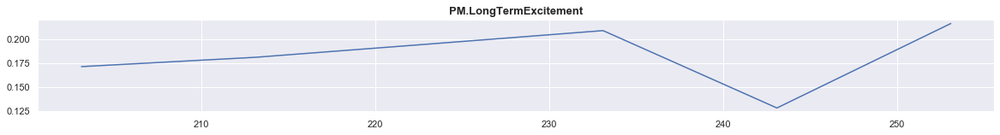

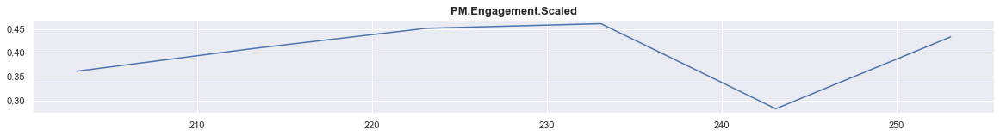

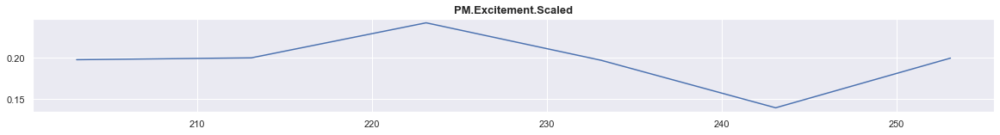

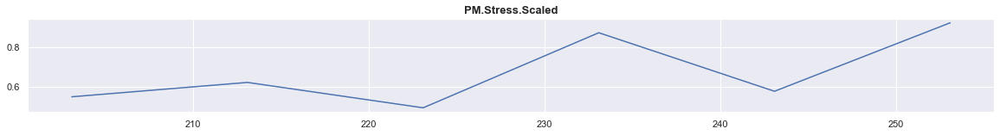

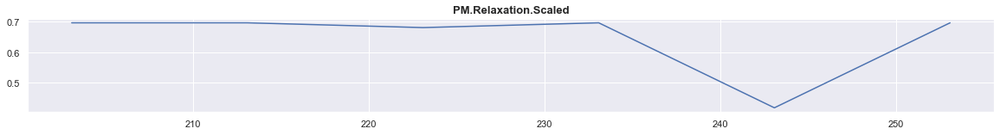

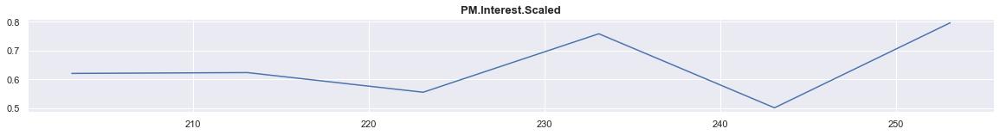

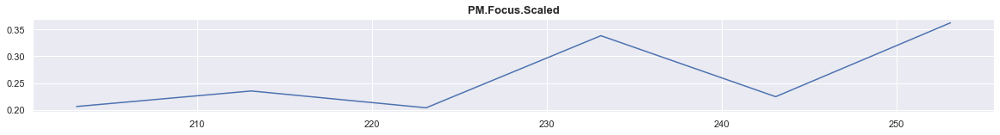

In [20]:
plot_channel("PM.LongTermExcitement")
for m in MENTAL:
    plot_channel("PM." + m + ".Scaled")

### Contact Quality 

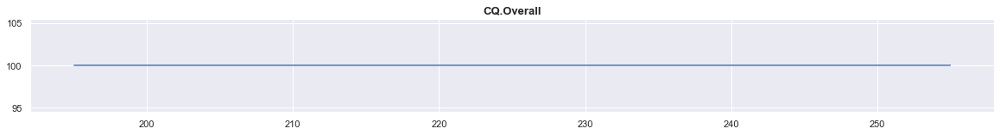

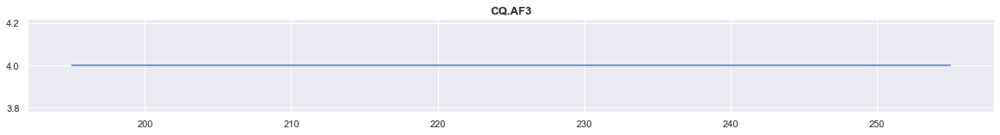

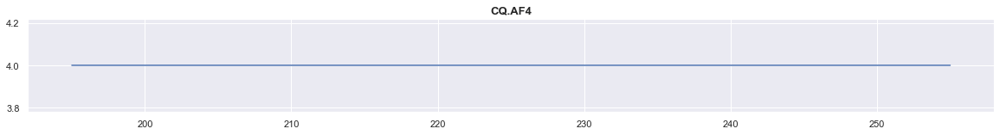

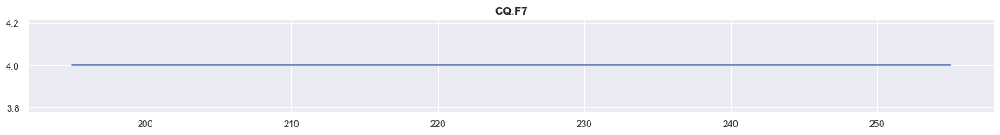

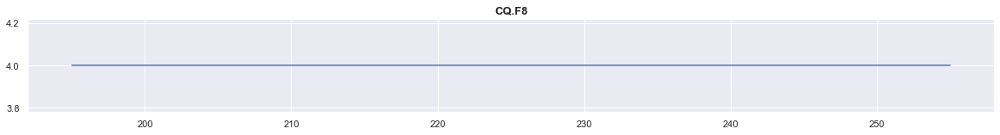

...

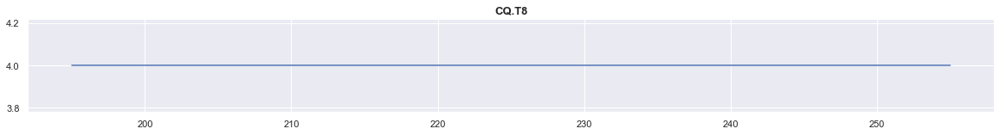

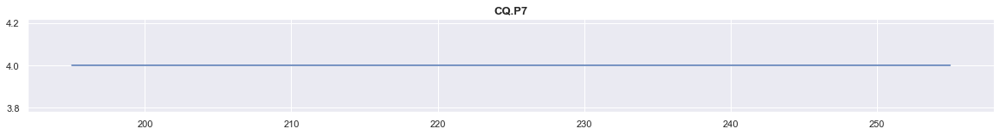

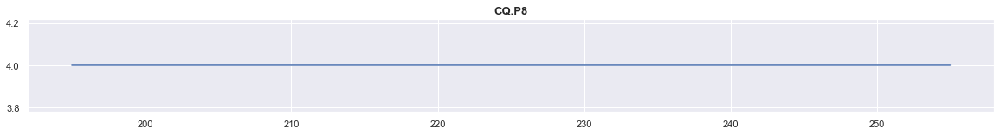

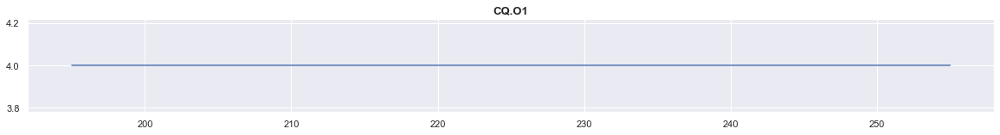

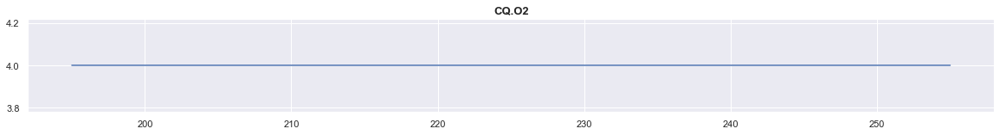

In [21]:
plot_channel("CQ.Overall")
for e in ELECTRODES:
    plot_channel("CQ." + e)

### Battery and Contact Quality (Raw) 

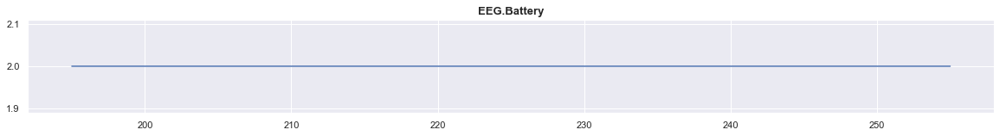

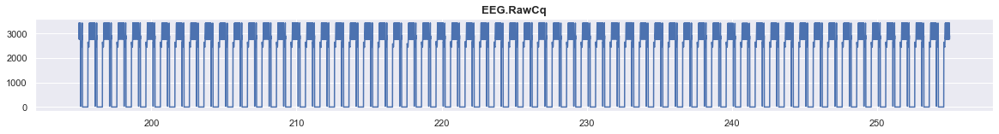

In [22]:
plot_channel("EEG.Battery")
plot_channel("EEG.RawCq")